In [1]:
import os
os.environ["CURL_CA_BUNDLE"]=""
os.environ['REQUESTS_CA_BUNDLE'] = ''
import ssl
ssl._create_default_https_context = ssl._create_unverified_context
os.environ["CUDA_VISIBLE_DEVICES"]="0"

import scipy
import IPython.display as ipd
import torchaudio
import yaml
import audioldm_train.utilities.audio as Audio
from librosa.filters import mel as librosa_mel_fn
from torch.cuda.amp import autocast, GradScaler
import librosa

import torch
from PIL import Image
from torchvision import transforms
import os
from tqdm import tqdm
import numpy as np
import matplotlib.pyplot as plt
from diffuser_helpers_cond_uncond_lora import extract_lora_diffusers, predict_noise0_diffuser
device = "cuda:0"

# set the path to the experiment directory
dir = 'output'
input_sample_1 = f"./audio/sample1.wav"
input_sample_2 = f"./audio/sample2.wav"

prompt1 = 'a sound clips of music composition' 
prompt2 = 'a sound clips of music composition' 

# Generation parameters
min_scale=1.5
max_scale=4.5


inversion_steps = 100
sampling_steps = 100

/home/users/u6536294/File/SoundMorpher/env/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/home/users/u6536294/File/SoundMorpher/env/lib/python3.8/site-packages/diffusers/utils/outputs.py:63: UserWarning: torch.utils._pytree._register_pytree_node is deprecated. Please use torch.utils._pytree.register_pytree_node instead.
  torch.utils._pytree._register_pytree_node(


In [2]:
# Seed everything
import random
import os
def seed_everything(seed: int):    
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = True
RANDOM_SEED = 1024
seed_everything(RANDOM_SEED)
g_cpu = torch.Generator().manual_seed(RANDOM_SEED)

In [3]:
@torch.no_grad()
def sample_model(unet, scheduler, c, scale, start_code):
    """Sample the model"""
    prev_noisy_sample = start_code
    for t in scheduler.timesteps:
        with torch.no_grad():
            noise_pred = unet(torch.cat([prev_noisy_sample] * 2), t, encoder_hidden_states=c).sample
            noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
            noise_pred = noise_pred_uncond + scale * (noise_pred_text - noise_pred_uncond)
            prev_noisy_sample = scheduler.step(noise_pred, t, prev_noisy_sample).prev_sample
    return prev_noisy_sample

@torch.no_grad()
def inverse_model(x0, unet, scheduler, c):
    """Inverse the model to get noise"""
    next_noisy_sample = x0

    for t in torch.flip(scheduler_inversion.timesteps, [0]):
        with torch.no_grad():
            noise_pred = unet(torch.cat([next_noisy_sample] * 2), t, encoder_hidden_states=c).sample
            _, noise_pred_text = noise_pred.chunk(2)
            next_noisy_sample = scheduler.step(noise_pred_text, t, next_noisy_sample).prev_sample

    return next_noisy_sample


def decode_to_waveform(dec,vocoder,image_key='fbank'):
    if image_key == "fbank":
        dec = dec.squeeze(1).permute(0, 2, 1)
        wav_reconstruction = vocoder_infer(dec, vocoder)
    elif image_key == "stft":
        dec = dec.squeeze(1).permute(0, 2, 1)
        wav_reconstruction = wave_decoder(dec)
    return wav_reconstruction

def latents_to_audios(latents,return_mel=False):
    # if scale:
    latents = 1 / vae.config.scaling_factor * latents
    mel_spec = vae.decode(latents).sample
    audio = pipe.mel_spectrogram_to_waveform(mel_spec)
    if return_mel == True:
        return audio, mel_spec
    else:
        audio = pipe.mel_spectrogram_to_waveform(mel_spec)
        return audio
    

In [4]:
def quick_sample(alpha,start_code1,start_code2,emb_1,emb_2,emb_prompt_1,emb_prompt_2,
    min_scale,max_scale,sampling_steps = 15,use_unet_uncon =False,return_mel = False):
    # Interpolate embeddings
    new_emb = alpha * emb_1 + (1 - alpha) * emb_2
    new_prompt_emb = alpha * emb_prompt_1 + (1 - alpha)* emb_prompt_2
    scale = max_scale - np.abs(alpha - 0.5) * (max_scale-min_scale) * 2.0
    new_start_code = slerp((1-alpha), start_code1, start_code2)
    # Obtain x0
    x0_new = pipe.quick_backward_diffusion(
        latents=new_start_code,
        generated_prompt_embeds=new_prompt_emb,
        prompt_embeds = new_emb,
        attention_mask = attention_mask_2,
        guidance_scale=scale,
        num_inference_steps=sampling_steps,
        generator = g_cpu,
        use_unet_uncon= use_unet_uncon,
    )
    # Obtain audio waveforms
    if return_mel:
        y,mel = latents_to_audios(x0_new,True)
        return y,mel
    else:
        y = latents_to_audios(x0_new)
        return y

In [5]:
def normalize_columns_to_range(arr, range_min=-1, range_max=1):
    # Create a copy of the array to avoid modifying the original array
    arr_normalized = np.copy(arr)
    
    # Normalize each column separately
    for i in range(arr.shape[1]):
        col_min = np.min(arr[:, i])
        col_max = np.max(arr[:, i])
        
        if col_min == col_max:
            # If all values in the column are the same, set them to the mid-point of the desired range
            arr_normalized[:, i] = (range_max + range_min) / 2
        else:
            # Normalize to [0, 1]
            arr_normalized[:, i] = (arr[:, i] - col_min) / (col_max - col_min)
            
            # Scale to the desired range [range_min, range_max]
            arr_normalized[:, i] = arr_normalized[:, i] * (range_max - range_min) + range_min
        
    return arr_normalized

In [6]:
from preprocessor import Preprocessor
# Read config
config_yaml = f"config/autoencoder/16k_64.yaml"
exp_name = os.path.basename(config_yaml.split(".")[0])
exp_group_name = os.path.basename(os.path.dirname(config_yaml))

config_yaml = os.path.join(config_yaml)
config_yaml = yaml.load(open(config_yaml, "r"), Loader=yaml.FullLoader)

# Obtain preprocessor
preprocessor = Preprocessor(config_yaml)


/home/users/u6536294/File/SoundMorpher/audioldm_train/utilities/audio/stft.py:42: FutureWarning: Pass size=1024 as keyword args. From version 0.10 passing these as positional arguments will result in an error
  fft_window = pad_center(fft_window, filter_length)
/home/users/u6536294/File/SoundMorpher/audioldm_train/utilities/audio/stft.py:145: FutureWarning: Pass sr=16000, n_fft=1024, n_mels=64, fmin=0, fmax=8000 as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel_basis = librosa_mel_fn(


In [7]:
# Spherical linear interpolation
# Borrowed from https://gist.github.com/dvschultz/3af50c40df002da3b751efab1daddf2c 
from torch import lerp
def slerp(t, v0, v1, DOT_THRESHOLD=0.9995):
    '''
    Spherical linear interpolation
    Args:
        t (float/np.ndarray): Float value between 0.0 and 1.0
        v0 (np.ndarray): Starting vector
        v1 (np.ndarray): Final vector
        DOT_THRESHOLD (float): Threshold for considering the two vectors as
                               colineal. Not -recommended to alter this.
    Returns:
        v2 (np.ndarray): Interpolation vector between v0 and v1
    '''
    c = False
    if not isinstance(v0,np.ndarray):
        c = True
        v0 = v0.detach().cpu().numpy()
    if not isinstance(v1,np.ndarray):
        c = True
        v1 = v1.detach().cpu().numpy()
    # Copy the vectors to reuse them later
    v0_copy = np.copy(v0)
    v1_copy = np.copy(v1)
    # Normalize the vectors to get the directions and angles
    v0 = v0 / np.linalg.norm(v0)
    v1 = v1 / np.linalg.norm(v1)
    # Dot product with the normalized vectors (can't use np.dot in W)
    dot = np.sum(v0 * v1)
    # If absolute value of dot product is almost 1, vectors are ~colineal, so use lerp
    if np.abs(dot) > DOT_THRESHOLD:
        return lerp(t, v0_copy, v1_copy)
    # Calculate initial angle between v0 and v1
    theta_0 = np.arccos(dot)
    sin_theta_0 = np.sin(theta_0)
    # Angle at timestep t
    theta_t = theta_0 * t
    sin_theta_t = np.sin(theta_t)
    # Finish the slerp algorithm
    # some implementation remove sin_theta_0, doesn't make much difference
    s0 = np.sin(theta_0 - theta_t) / sin_theta_0 
    s1 = sin_theta_t / sin_theta_0
    v2 = s0 * v0_copy + s1 * v1_copy
    if c:
        res = torch.from_numpy(v2).to(device)
    else:
        res = v2
    return res

In [8]:
from tqdm import tqdm
import librosa
import numpy as np

class SPDPBinarySearch:
    def __init__(self, num_uniform_samples = 10,search_tolerance=1e-2, device='cuda:0',
                 sample_method=None,load_audio=latents_to_audios, slerp=True, 
                 quit_search_thresh=1e-8,sr = 16000,McAdam=True):
        self.sr = sr
        self.num_uniform_samples = num_uniform_samples
        self.search_tolerance = search_tolerance # tolerance for binary search error
        self.sample_method = sample_method 
        self.load_audio = load_audio
        self.device = device
        self.slerp = slerp
        self.quit_search_thresh = quit_search_thresh
        self.McAdam = McAdam # set True, return McAdam timbre space

    def get_target_points(self,p0,p1):
        # Return N-2 interepolate points between p0 and p1
        points = []
        for i in range(1,self.num_uniform_samples-1):
            t = i / (self.num_uniform_samples - 1)
            p_i = (1 - t) * p0 + t * p1
            points.append(p_i)
        return np.array(points) 


    def timbre_space(self,y):
        # Compute perceptural points in the timbre space given audio y ans sr
        # McAdam returns the third dimension as spectral flux
        # Compute log attack time
        onset_env = librosa.onset.onset_strength(y=y, sr=self.sr)
        onset_frames = np.nonzero(onset_env > 0.01)[0]
        if len(onset_frames) > 1:
            attack_time = librosa.frames_to_time(onset_frames[1], sr=self.sr) - librosa.frames_to_time(onset_frames[0], sr=self.sr)
            log_attack_time = np.log10(attack_time + 1e-5)  # Add a small value to avoid log(0)
        else:
            log_attack_time = -1 # cannot compute log attack time, set it as -1
        # Compute the spectral centroid
        spectral_centroid = librosa.feature.spectral_centroid(y=y, sr=self.sr).mean()
        if self.McAdam == True:
            # Compute spectral flux
            spectral_flux = librosa.onset.onset_strength(y=y, sr=self.sr).mean()
            return np.array([log_attack_time,spectral_centroid,spectral_flux])
        else:
            # Compute spectral deviation
            S = np.abs(librosa.stft(y))
            sc = librosa.feature.spectral_centroid(S=S)
            spectral_deviation = np.mean(np.abs(S - sc), axis=0).mean()
            return np.array([log_attack_time,spectral_centroid,spectral_deviation])
            
    def compute_mel_spectrogram(self,y, n_components = 2, n_mels=128, n_fft=2048, hop_length=256):
        # Extract log Mel spectrogram given an audio sample, adjust parameters for FFT may causes different results in binary search
        mel_spectrogram = librosa.feature.melspectrogram(y=y, sr=self.sr, n_mels=n_mels, n_fft=n_fft, hop_length=hop_length)
        mel_spectrogram_db = librosa.power_to_db(mel_spectrogram, ref=np.max)
        mel_spectrogram_db = np.squeeze(mel_spectrogram_db.T,axis=-1) #[time,mel bin]
        return mel_spectrogram_db

        
    def L2_tensor(self, audio_1, audio_2):
        # Input two audio waves, output L2 distance of mel spectrogram
        p1 = self.compute_mel_spectrogram(audio_1.cpu().detach().numpy())
        p2 = self.compute_mel_spectrogram(audio_2.cpu().detach().numpy())
        return np.linalg.norm((p1 - p2))

    def binary_search(self, current_audio, start_audio, end_audio, start_alpha, end_alpha, emb_1, emb_2,emb_prompt_1,emb_prompt_2,
                      min_scale, max_scale, start_code1, start_code2,p_target,use_unet_uncon = False,sampling_steps = 20,
                      search_tolerance=5e-4,quit_search_thresh=1e-5, return_mel = True):
        # for each target intepolate point, use bineary search to find the closed alpha value
        start_alpha_temp = start_alpha
        end_alpha_temp = end_alpha
        y_mid, mel_mid= quick_sample(start_alpha_temp,start_code1,start_code2,emb_1,emb_2,emb_prompt_1,emb_prompt_2,min_scale,max_scale,sampling_steps = sampling_steps, use_unet_uncon = use_unet_uncon, return_mel = return_mel)
        distance_a0 = self.L2_tensor(y_mid, start_audio)
        distance_a1 = self.L2_tensor(y_mid, end_audio)
        total_distance = distance_a0 + distance_a1
        # Obtain current SPDP point
        p_mid = np.array([distance_a1 / total_distance, distance_a0 / total_distance])
        while np.abs(start_alpha_temp - end_alpha) > quit_search_thresh: 
            alpha_mid = (start_alpha_temp + end_alpha) / 2
            # mid spect, mid audio
            y_mid, mel_mid= quick_sample(alpha_mid,start_code1,start_code2,emb_1,emb_2,emb_prompt_1,emb_prompt_2,min_scale,max_scale,sampling_steps = sampling_steps, use_unet_uncon = use_unet_uncon, return_mel = return_mel)
            distance_a0 = self.L2_tensor(y_mid, start_audio)
            distance_a1 = self.L2_tensor(y_mid, end_audio)
            total_distance = distance_a0 + distance_a1
            # Obtain intermediate proportion point
            p_mid = np.array([distance_a1 / total_distance, distance_a0 / total_distance])
            if np.linalg.norm((p_mid-p_target)) < search_tolerance:
            	return (start_alpha_temp + end_alpha) / 2, p_mid
            if p_mid[0] > p_target[0][0]:
                end_alpha = (start_alpha_temp + end_alpha) / 2
            else:
                start_alpha_temp = (start_alpha_temp + end_alpha) / 2
        return (start_alpha_temp + end_alpha) / 2, p_mid

    
    def search(self,start_audio, end_audio, emb_1, emb_2,emb_prompt_1,emb_prompt_2, min_scale, 
        max_scale, start_code1, start_code2,target_SPDP,use_unet_uncon = False, 
        sampling_steps = 20,start_alpha=0, end_alpha=1,
        search_tolerance=1e-2,quit_search_thresh=1e-8,num_uniform_samples=10):
        alpha_list = [0]
        end_alpha = end_alpha
        current_alpha = start_alpha
        current_audio = start_audio
        print("Starting binary search ...")
        with tqdm(total=self.num_uniform_samples-2) as progress_bar:
            for idx in range(len(target_SPDP)):
                target_point = target_SPDP[idx].reshape(1,-1)
                current_alpha, current_audio = self.binary_search(current_audio, start_audio,end_audio,current_alpha, end_alpha, 
                           emb_1, emb_2, emb_prompt_1,emb_prompt_2,min_scale,
                           max_scale, start_code1, start_code2,target_point,use_unet_uncon = use_unet_uncon, sampling_steps = sampling_steps)
                alpha_list.append(current_alpha)
                progress_bar.update(1)
        if np.abs(alpha_list[-1] - 1) > quit_search_thresh:
            alpha_list = alpha_list + [1]
        return alpha_list

# Import AudioLDM2

In [9]:

from diffusers import AutoencoderKL,AudioLDM2UNet2DConditionModel,AudioLDM2ProjectionModel
from diffusers import DDIMScheduler, DDIMInverseScheduler
from transformers import RobertaTokenizer,ClapFeatureExtractor,GPT2Model,ClapModel,T5Tokenizer,T5EncoderModel,SpeechT5HifiGan,ClapFeatureExtractor, GPT2Model
dtype = torch.float32
model_id = "cvssp/audioldm2"

In [10]:
### load model
print(f'load models from path: {model_id}')

# 1. Load the autoencoder model which will be used to decode the latents into image space.
vae = AutoencoderKL.from_pretrained(model_id, subfolder="vae")

# 2. Load the tokenizer and text encoder to tokenize and encode the text.
tokenizer = RobertaTokenizer.from_pretrained(model_id, subfolder="tokenizer", torch_dtype=dtype)
tokenizer_2 = T5Tokenizer.from_pretrained(model_id, subfolder="tokenizer_2", torch_dtype=dtype)

text_encoder = ClapModel.from_pretrained(model_id, subfolder="text_encoder", torch_dtype=dtype)
text_encoder_2 = T5EncoderModel.from_pretrained(model_id, subfolder="text_encoder_2", torch_dtype=dtype)

# 3. The UNet model for generating the latents.
unet = AudioLDM2UNet2DConditionModel.from_pretrained(model_id, subfolder="unet", torch_dtype=dtype)
unet2 = AudioLDM2UNet2DConditionModel.from_pretrained(model_id, subfolder="unet", torch_dtype=dtype)

# 4. Scheduler for training images, eta is by default 0
scheduler_training = DDIMScheduler.from_pretrained(model_id, subfolder="scheduler", torch_dtype=dtype)

# 5. Scheduler for sampling images, eta is by default 0
scheduler_sampling = DDIMScheduler.from_pretrained(model_id, subfolder="scheduler", torch_dtype=dtype)

# 6. Scheduler for inversion into noise, eta is by default 0
scheduler_inversion = DDIMInverseScheduler.from_pretrained(model_id, subfolder="scheduler", torch_dtype=dtype)

# 7. Get vocoder
vocoder = SpeechT5HifiGan.from_pretrained("cvssp/audioldm2",subfolder="vocoder")

# 8. Get feature extractor
feature_extractor = ClapFeatureExtractor.from_pretrained("cvssp/audioldm2",subfolder="feature_extractor", torch_dtype=dtype)

# 9. Get language model
language_model = GPT2Model.from_pretrained("cvssp/audioldm2",subfolder="language_model", torch_dtype=dtype)

# 10. Get projection model
projection_model= AudioLDM2ProjectionModel.from_pretrained("cvssp/audioldm2",subfolder="projection_model", torch_dtype=dtype)

# 11. Get overall audioldm pipeline 
from pipeline_audioldm2_modified import AudioLDM2Pipeline
pipe = AudioLDM2Pipeline(vae,text_encoder,text_encoder_2,projection_model,language_model,tokenizer,tokenizer_2,
                         feature_extractor,unet,scheduler_sampling,scheduler_inversion,vocoder,None)


unet = unet.to(device)
unet2 = unet2.to(device)
vocoder = vocoder.to(device)
vae = vae.to(device)
text_encoder = text_encoder.to(device)
text_encoder_2 = text_encoder_2.to(device)
language_model = language_model.to(device)
projection_model = projection_model.to(device)

vae.requires_grad_(False)
text_encoder.requires_grad_(False)
text_encoder_2.requires_grad_(False)
unet.requires_grad_(False)
unet2.requires_grad_(False)
# feature_extractor.requires_grad_(False)
language_model.requires_grad_(False)
projection_model.requires_grad_(False)
vocoder.requires_grad_(False)


/home/users/u6536294/File/SoundMorpher/env/lib/python3.8/site-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


load models from path: cvssp/audioldm2


You are using the default legacy behaviour of the <class 'transformers.models.t5.tokenization_t5.T5Tokenizer'>. This is expected, and simply means that the `legacy` (previous) behavior will be used so nothing changes for you. If you want to use the new behaviour, set `legacy=False`. This should only be set if you understand what it means, and thoroughly read the reason why this was added as explained in https://github.com/huggingface/transformers/pull/24565
Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


SpeechT5HifiGan(
  (conv_pre): Conv1d(64, 1024, kernel_size=(7,), stride=(1,), padding=(3,))
  (upsampler): ModuleList(
    (0): ConvTranspose1d(1024, 512, kernel_size=(16,), stride=(5,), padding=(5,))
    (1): ConvTranspose1d(512, 256, kernel_size=(16,), stride=(4,), padding=(6,))
    (2): ConvTranspose1d(256, 128, kernel_size=(8,), stride=(2,), padding=(3,))
    (3): ConvTranspose1d(128, 64, kernel_size=(4,), stride=(2,), padding=(1,))
    (4): ConvTranspose1d(64, 32, kernel_size=(4,), stride=(2,), padding=(1,))
  )
  (resblocks): ModuleList(
    (0): HifiGanResidualBlock(
      (convs1): ModuleList(
        (0): Conv1d(512, 512, kernel_size=(3,), stride=(1,), padding=(1,))
        (1): Conv1d(512, 512, kernel_size=(3,), stride=(1,), padding=(3,), dilation=(3,))
        (2): Conv1d(512, 512, kernel_size=(3,), stride=(1,), padding=(5,), dilation=(5,))
      )
      (convs2): ModuleList(
        (0-2): 3 x Conv1d(512, 512, kernel_size=(3,), stride=(1,), padding=(1,))
      )
    )
    

In [11]:
# Audio Sample 1
log_mel_spec1, stft1, waveform1, random_start1  = preprocessor.read_audio_file(filename=input_sample_1)
# log_mel_spec1, audio_length_in_s = pipe.preprocessing(input_sample_1)
log_mel_spec1 = log_mel_spec1.float().to(device).unsqueeze(0).unsqueeze(0)
init_latent_1 = vae.config.scaling_factor * vae.encode(log_mel_spec1).latent_dist.sample(g_cpu)
init_latent_1 = init_latent_1.to(dtype)

# Audio Sample 2
log_mel_spec2, stft2, waveform2, random_start2  = preprocessor.read_audio_file(filename=input_sample_2)
log_mel_spec2 = log_mel_spec2.float().to(device).unsqueeze(0).unsqueeze(0)
# init_latent_1 = vae.config.scaling_factor * vae.encode(log_mel_spec2).latent_dist.sample()
init_latent_2 = vae.config.scaling_factor * vae.encode(log_mel_spec2).latent_dist.sample(g_cpu)
init_latent_2 = init_latent_2.to(dtype)


/home/users/u6536294/File/SoundMorpher/preprocessor.py:152: FutureWarning: Pass sr=16000, n_fft=1024, n_mels=64, fmin=0, fmax=8000 as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = librosa_mel_fn(


In [12]:
import torch.nn.functional as F

negative_prompt = 'low quality'

with torch.no_grad():
    prompt_embeds_1, attention_mask_1,genearted_prompt_embeds_1 = pipe.encode_prompt(prompt1,device,1,True,negative_prompt = negative_prompt)
    prompt_embeds_2, attention_mask_2,genearted_prompt_embeds_2 = pipe.encode_prompt(prompt2,device,1,True,negative_prompt = negative_prompt)



emb_1 = prompt_embeds_1.clone()
emb_prompt_1 = genearted_prompt_embeds_1.clone()
emb_2 = prompt_embeds_2.clone()
emb_prompt_2 = genearted_prompt_embeds_2.clone()
emb_1_copy= genearted_prompt_embeds_1.clone()
emb_2_copy = genearted_prompt_embeds_2.clone()

# Textual Inversion


In [13]:
from diffusers.utils.torch_utils import randn_tensor
emb_1.requires_grad = True
emb_2.requires_grad = True
attention_mask_1.requires_grad=False
attention_mask_2.requires_grad=False
emb_prompt_1.require_grad=True
emb_prompt_2.require_grad=True
lr = 2e-3
it = 2500
# start_code = torch.randn_like(init_latent_1) # random init latent x_0
start_code = randn_tensor(init_latent_1.shape, generator=g_cpu, dtype=dtype)
start_code = start_code * scheduler_sampling.init_noise_sigma
start_code = start_code.to(device)
# shape = 
# start_code = randn_tensor(
num_train_timesteps = len(scheduler_training.betas)
scheduler_training.set_timesteps(num_train_timesteps)
scheduler_sampling.set_timesteps(sampling_steps)
scheduler_inversion.set_timesteps(inversion_steps)

100%|█████████████████████████| 2500/2500 [04:01<00:00, 10.36it/s, loss=0.00442]


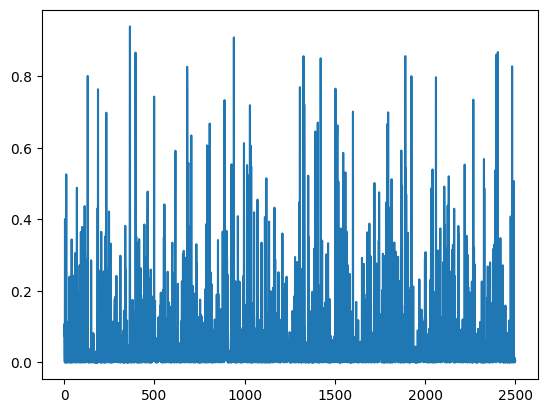

In [14]:
opt = torch.optim.Adam([emb_1,emb_prompt_1], lr=lr)

# Define a scheduler for learning rate decay
step_size = 1000  # Decay learning rate every 10 epochs
gamma = 0.1     # Multiply learning rate by 0.1
scheduler = torch.optim.lr_scheduler.StepLR(opt, step_size=step_size, gamma=gamma)

# opt = torch.optim.Adam([emb_1], lr=lr)
criteria = torch.nn.MSELoss()
history = []
pbar = tqdm(range(it))
#emb_1_copy = emb_1.clone()
for i in pbar:
    opt.zero_grad()
    noise = randn_tensor(init_latent_1.shape, generator=g_cpu, dtype=dtype).to(device)
    t_enc = torch.randint(num_train_timesteps, (1,), device=device)
    z = scheduler_training.add_noise(init_latent_1, noise, t_enc)
    pred_noise = predict_noise0_diffuser(unet, z, emb_prompt_1, emb_1, attention_mask_1, t_enc, dtype = dtype, guidance_scale=1 ,scheduler=scheduler_training)
    loss = criteria(pred_noise, noise) # float32
    loss.backward()
    pbar.set_postfix({"loss": loss.item()})
    history.append(loss.item())
    opt.step()
    
    # Step the scheduler
    scheduler.step()
plt.plot(history)
plt.show()

In [15]:
torch.cuda.empty_cache()

In [16]:
#load modified diffuser pipeline for reverse diffusion

start_code1 = pipe.forward_diffusion(
    latents=init_latent_1,
    generated_prompt_embeds=emb_prompt_1,
    prompt_embeds = emb_1,
    attention_mask = attention_mask_1,
    guidance_scale=1,
    num_inference_steps=100,
    generator = g_cpu,
)
print(start_code1.var())
audio = latents_to_audios(start_code1)
ipd.Audio(audio[0], rate=16000)


100%|█████████████████████████████████████████| 100/100 [00:09<00:00, 10.08it/s]


tensor(0.9702, device='cuda:0')


In [17]:
#IMPUS: random sample given random init latent, this results shows if using the optimized prompt embedding, but random noise, the result shows consistency with the prompt.
# In this case, if the start code is random init latent, synthesised audio cannot make sure content consistency even given informative prompts.
print(start_code.var())
x0 = pipe.backward_diffusion(
    latents=start_code,
    generated_prompt_embeds=emb_prompt_1,
    prompt_embeds = emb_1,
    attention_mask = attention_mask_1,
    guidance_scale=min_scale,
    num_inference_steps=sampling_steps,
    generator = g_cpu,
)

audio = latents_to_audios(x0)
ipd.Audio(audio[0], rate=16000)

tensor(1.0058, device='cuda:0')


100%|█████████████████████████████████████████| 100/100 [00:08<00:00, 11.71it/s]


In [18]:
# sanity check for ddim inversion, should be close to 1, otherwise treated as outlier
#load modified diffuser pipeline for reverse diffusion
start_code1_var = start_code1.var()
print('variance of inverted xT:', start_code1_var)
x0_0 = pipe.backward_diffusion(
    latents=start_code1,
    generated_prompt_embeds=emb_prompt_1,
    prompt_embeds = emb_1,
    attention_mask = attention_mask_1,
    guidance_scale=min_scale,
    num_inference_steps=sampling_steps,
    generator = g_cpu,
)
audio = latents_to_audios(x0_0)
ipd.Audio(audio[0], rate=16000)

variance of inverted xT: tensor(0.9702, device='cuda:0')


100%|█████████████████████████████████████████| 100/100 [00:05<00:00, 16.81it/s]


In [19]:
torch.cuda.empty_cache()

100%|██████████████████████████| 2500/2500 [04:01<00:00, 10.33it/s, loss=0.0767]


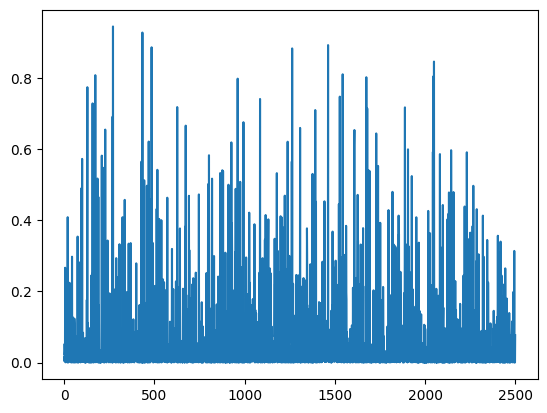

In [20]:
opt = torch.optim.Adam([emb_2,emb_prompt_2], lr=lr)
criteria = torch.nn.MSELoss()
history = []
pbar = tqdm(range(it))
for i in pbar:
    opt.zero_grad()
    noise = randn_tensor(init_latent_2.shape, generator=g_cpu, dtype=dtype).to(device)
    t_enc = torch.randint(num_train_timesteps, (1,), device=device)
    z = scheduler_training.add_noise(init_latent_2, noise, t_enc)
    pred_noise = predict_noise0_diffuser(unet, z, emb_prompt_2, emb_2, attention_mask_2, t_enc, dtype = dtype, guidance_scale=1 ,scheduler=scheduler_training)
    loss = criteria(pred_noise, noise) # float32
    loss.backward()
    pbar.set_postfix({"loss": loss.item()})
    history.append(loss.item())
    opt.step()
plt.plot(history)
plt.show()

In [21]:
# Noise code inversion
start_code2 = pipe.forward_diffusion(
    latents=init_latent_2,
    generated_prompt_embeds=emb_prompt_2,
    prompt_embeds = emb_2,
    attention_mask = attention_mask_2,
    guidance_scale=1,
    generator = g_cpu,
    num_inference_steps=inversion_steps,
)

audio = latents_to_audios(start_code2)
ipd.Audio(audio[0], rate=16000)


100%|█████████████████████████████████████████| 100/100 [00:10<00:00,  9.61it/s]


In [22]:
#random sample
x0 = pipe.backward_diffusion(
    latents=start_code,
    generated_prompt_embeds=emb_prompt_2,
    prompt_embeds = emb_2,
    attention_mask = attention_mask_2,
    guidance_scale=min_scale,
    num_inference_steps=sampling_steps,
    generator = g_cpu,
)
audio = latents_to_audios(x0)
ipd.Audio(audio[0], rate=16000)


100%|█████████████████████████████████████████| 100/100 [00:06<00:00, 16.34it/s]


In [23]:
# sanity check for ddim inversion, should be close to 1, otherwise treated as outlier
start_code2_var = start_code2.var()
print('variance of inverted xT:', start_code2_var)
x0_1 = pipe.backward_diffusion(
    latents=start_code2,
    generated_prompt_embeds=emb_prompt_2,
    prompt_embeds = emb_2,
    attention_mask = attention_mask_2,
    guidance_scale=min_scale,
    num_inference_steps=sampling_steps,
    generator = g_cpu,
)
audio = latents_to_audios(x0_1)
ipd.Audio(audio[0], rate=16000)


variance of inverted xT: tensor(0.9690, device='cuda:0')


100%|█████████████████████████████████████████| 100/100 [00:06<00:00, 16.27it/s]


In [24]:
# Store variables above
if not os.path.exists(f'./{dir}/'):
    os.mkdir(f'./{dir}/')    
torch.save(emb_1, f'./{dir}/emb_1.pt')
torch.save(emb_2, f'./{dir}/emb_2.pt')
torch.save(emb_prompt_1, f'./{dir}/emb_prompt_1.pt')
torch.save(emb_prompt_2, f'./{dir}/emb_prompt_2.pt')
torch.save(attention_mask_1, f'./{dir}/attention_mask_1.pt')
torch.save(attention_mask_2, f'./{dir}/attention_mask_2.pt')
torch.save(start_code1, f'./{dir}/start_code1.pt')
torch.save(start_code2, f'./{dir}/start_code2.pt')
torch.save(init_latent_1, f'./{dir}/init_latent_1.pt')
torch.save(init_latent_2, f'./{dir}/init_latent_2.pt')

# Model fine tune with target and optimized embedding via LoRA

In [25]:
import random
def seed_everything(seed: int):    
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = True
    
seed_everything(RANDOM_SEED)

In [26]:
LORA_RANK = 4 # Adjust LoRA rank here

In [27]:
unet = unet.eval()
unet2 = unet2.eval()

In [28]:
torch.cuda.empty_cache()
lr = 1e-3
unet_lora, unet_lora_layers = extract_lora_diffusers(unet, device, rank = LORA_RANK)
lora_params = list(unet_lora_layers.parameters())
for param in unet_lora.parameters():
    param.requires_grad = True
unet_lora.to(device)
opt = torch.optim.AdamW([{"params": lora_params, "lr": lr}], lr=lr)
print(f'number of trainable parameters of LoRA model in optimizer: {sum(p.numel() for p in lora_params if p.requires_grad)}')

number of trainable parameters of LoRA model in optimizer: 1468416


In [29]:
emb_1.requires_grad = False
emb_prompt_1.requires_grad = False
emb_2.requires_grad = False
emb_prompt_2.requires_grad = False
unet_lora.train()
it = 150
criteria = torch.nn.MSELoss()
history = []

pbar = tqdm(range(it))


for i in pbar:
    opt.zero_grad()
    noise = randn_tensor(init_latent_1.shape, generator=g_cpu, dtype=dtype).to(device)
    t_enc = torch.randint(num_train_timesteps, (1,), device=device)
    z = scheduler_training.add_noise(init_latent_1, noise, t_enc)
    
    pred_noise = predict_noise0_diffuser(unet_lora, z, emb_prompt_1, emb_1, attention_mask_1, t_enc, 
                                         dtype = dtype, guidance_scale=1,
                                         scheduler=scheduler_training, cross_attention_kwargs = {'scale': 1})

    loss = criteria(pred_noise, noise)
    loss.backward()
    

    noise = randn_tensor(init_latent_2.shape, generator=g_cpu, dtype=dtype).to(device)
    t_enc = torch.randint(num_train_timesteps, (1,), device=device)
    z = scheduler_training.add_noise(init_latent_2, noise, t_enc)
    pred_noise = predict_noise0_diffuser(unet_lora, z, emb_prompt_2, emb_2, attention_mask_2, t_enc, 
                                         dtype = dtype, guidance_scale=1,
                                         scheduler=scheduler_training, cross_attention_kwargs = {'scale': 1})
    loss = criteria(pred_noise, noise)
    loss.backward()
    
    pbar.set_postfix({"loss": loss.item()})
    history.append(loss.item())
    opt.step()

/home/users/u6536294/File/SoundMorpher/env/lib/python3.8/site-packages/diffusers/models/attention_processor.py:1871: FutureWarning: `LoRAAttnProcessor` is deprecated and will be removed in version 0.26.0. Make sure use AttnProcessor instead by settingLoRA layers to `self.{to_q,to_k,to_v,to_out[0]}.lora_layer` respectively. This will be done automatically when using `LoraLoaderMixin.load_lora_weights`
  deprecate(
100%|██████████████████████████| 150/150 [01:06<00:00,  2.24it/s, loss=0.000561]


# Fine tune the unconditional score

In [30]:
torch.cuda.empty_cache()
LORA_RANK_uncond = 2
lr = 1e-3
unet_lora_uncond, unet_lora_layers_uncond = extract_lora_diffusers(unet2, device, rank = LORA_RANK_uncond)
lora_params_uncond = list(unet_lora_layers_uncond.parameters())
unet_lora_uncond.to(device)
opt = torch.optim.AdamW([{"params": lora_params_uncond, "lr": lr}], lr=lr)
print(f'number of trainable parameters of LoRA model in optimizer: {sum(p.numel() for p in lora_params_uncond if p.requires_grad)}')

number of trainable parameters of LoRA model in optimizer: 734208


In [31]:
for param in unet_lora_uncond.parameters():
    param.requires_grad = True

In [32]:
prompt_embeds_uncond, attention_mask_uncond,genearted_prompt_embeds_uncond = pipe.encode_prompt(["low quality"],device,1,True,negative_prompt = [""])

emb_1.requires_grad = False
emb_prompt_1.requires_grad = False
emb_2.requires_grad = False
emb_prompt_2.requires_grad = False

unet_lora_uncond.train()
it = 15
criteria = torch.nn.MSELoss()
history = []

pbar = tqdm(range(it))
for i in pbar:
    opt.zero_grad()
    noise = randn_tensor(init_latent_1.shape, generator=g_cpu, dtype=dtype).to(device)
    t_enc = torch.randint(num_train_timesteps, (1,), device=device)
    z = scheduler_training.add_noise(init_latent_1, noise, t_enc)
    pred_noise = predict_noise0_diffuser(unet_lora_uncond, z, genearted_prompt_embeds_uncond, prompt_embeds_uncond, attention_mask_uncond, t_enc, 
                                         dtype = dtype, guidance_scale=1 ,
                                         scheduler=scheduler_training,cross_attention_kwargs = {'scale': 1})

    loss = criteria(pred_noise, noise)
    loss.backward()
    
    # prior preserve embedding 
    noise = randn_tensor(init_latent_2.shape, generator=g_cpu, dtype=dtype).to(device)
    t_enc = torch.randint(num_train_timesteps, (1,), device=device)
    z = scheduler_training.add_noise(init_latent_2, noise, t_enc)
    pred_noise = predict_noise0_diffuser(unet_lora_uncond, z, genearted_prompt_embeds_uncond, prompt_embeds_uncond, attention_mask_uncond, t_enc, 
                                         dtype = dtype, guidance_scale=1 ,
                                         scheduler=scheduler_training, cross_attention_kwargs = {'scale': 1})
    loss = criteria(pred_noise, noise)
    loss.backward()
    
    pbar.set_postfix({"loss": loss.item()})
    history.append(loss.item())
    opt.step()

100%|██████████████████████████████| 15/15 [00:06<00:00,  2.31it/s, loss=0.0842]


In [33]:
unet_lora_uncond = unet_lora_uncond.eval()
unet_lora = unet_lora.eval()

In [34]:
# Save ckpt
if not os.path.exists(f'./{dir}/con_lora/'):
    os.mkdir(f'./{dir}/con_lora/')
if not os.path.exists(f'./{dir}/uncon_lora/'):
    os.mkdir(f'./{dir}/uncon_lora/')    
unet_lora.save_attn_procs(save_directory=f'./{dir}/con_lora/')
unet_lora_uncond.save_attn_procs(save_directory=f'./{dir}/uncon_lora/')


# Get initial code

In [35]:
# #load modified diffuser pipeline for reverse diffusion
use_unet_uncon = True
if use_unet_uncon == True:
    from pipeline_audioldm2_modified import AudioLDM2Pipeline
    pipe = AudioLDM2Pipeline(vae,text_encoder,text_encoder_2,projection_model,language_model,tokenizer,tokenizer_2,
                             feature_extractor,unet_lora,scheduler_sampling,scheduler_inversion,vocoder,unet_uncond=unet_lora_uncond)

In [36]:
start_code1 = pipe.forward_diffusion(
    latents=init_latent_1,
    generated_prompt_embeds=emb_prompt_1,
    prompt_embeds = emb_1,
    attention_mask = attention_mask_1,
    guidance_scale=1,
    num_inference_steps=inversion_steps,
    generator = g_cpu,
)

100%|█████████████████████████████████████████| 100/100 [00:13<00:00,  7.69it/s]


In [37]:
#sanity check for ddim inversion, should be close to 1
print('variance of inverted xT:', start_code1.var())
x0 = pipe.backward_diffusion(
    latents=start_code1,
    generated_prompt_embeds=emb_prompt_1,
    prompt_embeds = emb_1,
    attention_mask = attention_mask_1,
    guidance_scale=min_scale,
    num_inference_steps=sampling_steps,
    generator = g_cpu,
    use_unet_uncon=use_unet_uncon,
)
start_audio,start_mel = latents_to_audios(x0,True)
ipd.Audio(start_audio[0], rate=16000)

variance of inverted xT: tensor(0.9703, device='cuda:0')


100%|█████████████████████████████████████████| 100/100 [00:12<00:00,  7.75it/s]


In [38]:
start_code2 = pipe.forward_diffusion(
    latents= init_latent_2,
    generated_prompt_embeds=emb_prompt_2,
    prompt_embeds = emb_2,
    attention_mask = attention_mask_2,
    guidance_scale=1,
    num_inference_steps=inversion_steps,
    generator = g_cpu,
)

100%|█████████████████████████████████████████| 100/100 [00:13<00:00,  7.61it/s]


In [39]:
#sanity check for ddim inversion, should be close to 1
print('variance of inverted xT:', start_code2.var())

x0 = pipe.backward_diffusion(
    latents= start_code2,
    generated_prompt_embeds=emb_prompt_2,
    prompt_embeds = emb_2,
    attention_mask = attention_mask_2,
    guidance_scale=min_scale,
    num_inference_steps=sampling_steps,
    generator = g_cpu,
    use_unet_uncon=use_unet_uncon,
)
end_audio,end_mel = latents_to_audios(x0,True)
ipd.Audio(end_audio[0], rate=16000)

variance of inverted xT: tensor(0.9673, device='cuda:0')


100%|█████████████████████████████████████████| 100/100 [00:12<00:00,  7.78it/s]


# Perceptually Uniform Interpolation

In [40]:
num_uniform_samples = 15

sampling_alpha = SPDPBinarySearch(num_uniform_samples = num_uniform_samples, search_tolerance=1e-2,
                                   sample_method=quick_sample, load_audio=latents_to_audios)
uniform_points = sampling_alpha.get_target_points(np.array([0,1]),np.array([1,0]))


In [41]:

alpha_list = sampling_alpha.search(start_audio, end_audio, emb_1, emb_2, emb_prompt_1,emb_prompt_2,min_scale, max_scale,start_code1,start_code2,
                                    target_SPDP = uniform_points,use_unet_uncon = True, sampling_steps = sampling_steps, start_alpha=0, end_alpha=1, num_uniform_samples=num_uniform_samples)
print("Complete binary search. Perceptually uniform morph factors are ...")
print(alpha_list)

Starting binary search ...


100%|██████████████████████████████████████████| 13/13 [35:01<00:00, 161.68s/it]

Complete binary search. Perceptually uniform morph factors are ...
[0, 0.0130615234375, 0.061733782291412354, 0.1313707281369716, 0.2058860138793719, 0.278007694259468, 0.44201648261450543, 0.48152215157002143, 0.5181042067937187, 0.5263397306033963, 0.5668100168351815, 0.6767996609981237, 0.8039966694139011, 0.9280300270504168, 1]


In [42]:
# Plot 3D timbre space
from scipy.io.wavfile import write
from IPython.display import display, clear_output

all_timbre_points = []
all_perceptual_points = []
mel_sequence_xT_slerp = []
audio_sequence_xT_slerp = []
x0_list = []
output_path = f"{dir}/output"
os.makedirs(output_path, exist_ok=True)
for idx,alpha_i in enumerate(alpha_list):
    alpha = alpha_i
    emb = alpha * emb_1 + (1 - alpha) * emb_2
    prompt_emb = alpha * emb_prompt_1 + (1 - alpha) * emb_prompt_2
    scale = max_scale - np.abs(alpha - 0.5) * (max_scale-min_scale) * 2.0
    new_start_code = slerp((1-alpha), start_code1, start_code2)
    
    x0_new = pipe.backward_diffusion(
    latents=new_start_code,
    generated_prompt_embeds=prompt_emb,
    prompt_embeds = emb,
    attention_mask = attention_mask_1,
    guidance_scale=scale,
    num_inference_steps=sampling_steps,
    generator = g_cpu,
    use_unet_uncon= use_unet_uncon,
    )

    x0_list.append(x0_new)
    audio,mel = latents_to_audios(x0_new,True)
    mel_sequence_xT_slerp.append(mel[0]) 
    audio_sequence_xT_slerp.append(audio[0])
    print("Alpha value:",alpha)
    ipd.display(ipd.Audio(audio[0].cpu().detach().numpy(), rate=16000))
    # Obtain timbre point
    timbre_point = sampling_alpha.timbre_space(audio.detach().cpu().numpy())
    all_timbre_points.extend(timbre_point)
    # Obtain perceptual point
    distance_a0 = sampling_alpha.L2_tensor(audio, start_audio)
    distance_a1 = sampling_alpha.L2_tensor(audio, end_audio)
    total_distance = distance_a0 + distance_a1
    # Obtain intermediate proportion point
    p_alpha = np.array([distance_a1 / total_distance, distance_a0 / total_distance])
    all_perceptual_points.append(p_alpha)
    # Save audios
    write(f"{output_path}/{alpha_i}.wav",16000, audio[0].cpu().detach().numpy())

100%|█████████████████████████████████████████| 100/100 [00:12<00:00,  7.84it/s]


Alpha value: 0


100%|█████████████████████████████████████████| 100/100 [00:12<00:00,  7.83it/s]


Alpha value: 0.0130615234375


100%|█████████████████████████████████████████| 100/100 [00:12<00:00,  7.83it/s]


Alpha value: 0.061733782291412354


100%|█████████████████████████████████████████| 100/100 [00:12<00:00,  7.83it/s]


Alpha value: 0.1313707281369716


100%|█████████████████████████████████████████| 100/100 [00:12<00:00,  7.82it/s]


Alpha value: 0.2058860138793719


100%|█████████████████████████████████████████| 100/100 [00:12<00:00,  7.80it/s]


Alpha value: 0.278007694259468


100%|█████████████████████████████████████████| 100/100 [00:12<00:00,  7.82it/s]


Alpha value: 0.44201648261450543


100%|█████████████████████████████████████████| 100/100 [00:12<00:00,  7.82it/s]


Alpha value: 0.48152215157002143


100%|█████████████████████████████████████████| 100/100 [00:12<00:00,  7.82it/s]


Alpha value: 0.5181042067937187


100%|█████████████████████████████████████████| 100/100 [00:12<00:00,  7.80it/s]


Alpha value: 0.5263397306033963


100%|█████████████████████████████████████████| 100/100 [00:12<00:00,  7.82it/s]


Alpha value: 0.5668100168351815


100%|█████████████████████████████████████████| 100/100 [00:12<00:00,  7.81it/s]


Alpha value: 0.6767996609981237


100%|█████████████████████████████████████████| 100/100 [00:12<00:00,  7.80it/s]


Alpha value: 0.8039966694139011


100%|█████████████████████████████████████████| 100/100 [00:12<00:00,  7.81it/s]


Alpha value: 0.9280300270504168


100%|█████████████████████████████████████████| 100/100 [00:12<00:00,  7.78it/s]


Alpha value: 1


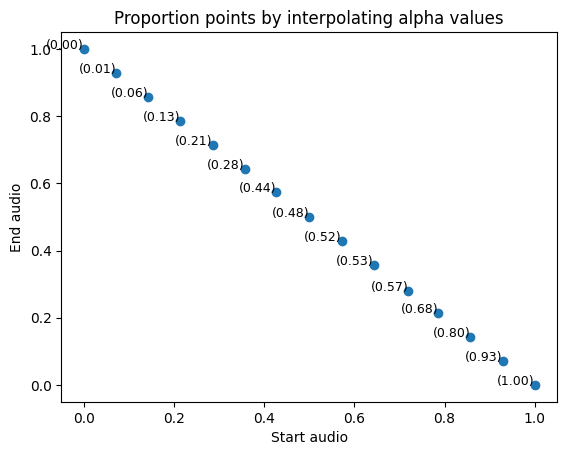

In [43]:
# Plot proportion distance 2D scatter plot
all_perceptual_points = np.array(all_perceptual_points)
fig = plt.figure()
ax = fig.add_subplot(111) #projection='3d'
# print(all_perceptual_points)
ax.scatter(all_perceptual_points[:,0],all_perceptual_points[:,1], marker='o')
for i, point in enumerate(all_perceptual_points):
    plt.text(point[0], point[1], f'({alpha_list[i]:.2f})', fontsize=9, ha='right')
ax.set_xlabel('Start audio')
ax.set_ylabel('End audio')
ax.set_title('Proportion points by interpolating alpha values')
plt.show()

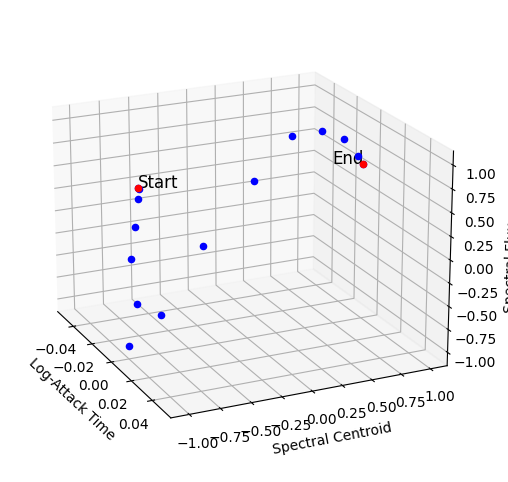

In [60]:
# Plot timbre space, only two music composition with the same content works (Timbral morphing)
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
%matplotlib inline

all_timre_points = np.array(all_timbre_points).reshape(-1,3)
all_timre_points = normalize_columns_to_range(all_timre_points)
fig = plt.figure(figsize=(6, 6))
ax = fig.add_subplot(111, projection='3d')
for i, point in enumerate(all_timre_points):
    ax.scatter(point[0], point[1], point[2], color='b', marker='o')
ax.scatter(all_timre_points[0,0], all_timre_points[0,1], all_timre_points[0,2], color='r', marker='o')
ax.scatter(all_timre_points[-1,0], all_timre_points[-1,1], all_timre_points[-1,2], color='r', marker='o')
ax.text(all_timre_points[0,0], all_timre_points[0,1], all_timre_points[0,2], 'Start', fontsize=12, ha='left')
ax.text(all_timre_points[-1,0], all_timre_points[-1,1], all_timre_points[-1,2], 'End', fontsize=12, ha='right')

ax.set_xlabel('Log-Attack Time')
ax.set_ylabel('Spectral Centroid')
ax.set_zlabel('Spectral Flux')
ax.view_init(elev=20, azim=-25)
plt.show()


<Figure size 5000x1500 with 0 Axes>

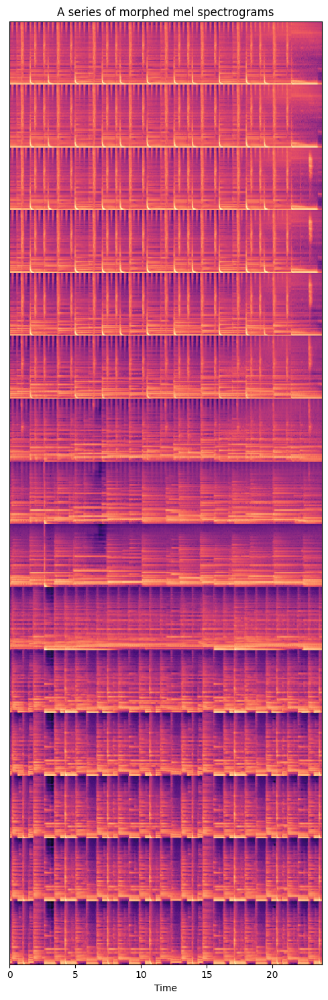

In [61]:
# Visualize morphed mel spectrograms
import librosa.display
%matplotlib inline
# Plot mel-spectrogram
plt.figure(figsize=(50,num_uniform_samples))

length_output = len(mel_sequence_xT_slerp)

# Remove the single-dimensional entries from each Mel spectrogram and stack them horizontally
mel_spectrograms = [mel_spec.squeeze().cpu().detach().numpy() for mel_spec in mel_sequence_xT_slerp]
concatenated_mel_spectrogram = np.hstack(mel_spectrograms).T

# Plot the concatenated Mel spectrogram
fig, ax = plt.subplots(figsize=(5, length_output))
img = librosa.display.specshow(concatenated_mel_spectrogram, x_axis='time', ax=ax)
ax.set_title('A series of morphed mel spectrograms')

# Hide the y-axis
ax.yaxis.set_visible(False)

plt.tight_layout()
plt.show()


In [44]:
# Dynamic morphing based on z space
# If perform dynamic morphing, please run this code
sr = 16000

# Function to split an audio into N clips
def split_latent(x0, num_clips):
    clip_length = x0.shape[2] // num_clips
    clips = [x0[:,:,i*clip_length:(i+1)*clip_length,:] for i in range(num_clips)]
    return clips

# Function to concatenate the i-th clip from each audio
def concatenate_clips(clips_list):
    concatenated_audio = np.concatenate([clips for clips in clips_list],2)
    return concatenated_audio

num_audios = len(audio_sequence_xT_slerp)

# Initialize lists to store audio data and sample rate
audio_data = []

# Load audio files and split into clips
all_clips = []
for x_i in x0_list:
    
    x_i = x_i.cpu().detach().numpy()
   
    clips = split_latent(x_i, num_audios)
    all_clips.append(clips)


# Concatenate the i-th clip from each audio
concate_list = []
for i in range(num_audios):
    concate_list.append(all_clips[i][i])
# print(len(concate_list[0]))
final_x0 = concatenate_clips(concate_list)
final_audio = latents_to_audios(torch.Tensor(final_x0).cuda(),False)

print("Dynamic morphed results:")
ipd.display(ipd.Audio(final_audio, rate=16000))




Dynamic morphed results:
